In [1]:
import numpy as np
import pandas as pd 

from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

import tensorflow as tf
import seaborn as sns
import matplotlib.pyplot as plt
from itertools import cycle
from sklearn.model_selection import StratifiedKFold
from tensorflow.keras.utils import to_categorical
from keras import regularizers

In [2]:
#fixed random seed for reproducibility 
np.random.seed(0)

In [3]:
# load dataset (input variables = X, output variables = Y)
df = pd.read_csv("2.csv")

#count the number of occurances for each osID
OsID_counts = df['OsID'].value_counts()

#filter for osIDs that have 10 or more occurances
OsID_counts_filtered = OsID_counts[OsID_counts >= 10]

#assign a label for each osID 
OsID_labels = {}
class_no = 0
for osID in OsID_counts_filtered.index:
    OsID_labels[osID] = class_no
    class_no +=1

#filter the dataset with osID that contain 10 or more occurances
dataGene = df[df['OsID'].isin(OsID_counts_filtered.index)]

dataGene = dataGene.drop(['Class', 'Trait'],axis=1)

# Add a new column 'class' to the filtered dataset
dataGene['class'] = dataGene['OsID'].map(OsID_labels)

#print("Summary of dataGene:\n",dataGene.describe())

In [4]:
X = dataGene.drop(['class','OsID'], axis=1) # exclude class & OsID column
Y = dataGene['class']

#input feature names in order of descending importance scores in MI feature selection method
feature_names = ['Root10DaysSeedling', 'Shoot10DaysSeedling', 'Root35DaysSeedling', 'Leaf45DaysOldPlant', 'Shoot35DaysSeedling',
                 'Root14DaysSeedling', 'Root24DaysSeedling', 'Root17DaysSeedling', 'Root21DaysSeedling', 'Shoot3DaysSeedling',
                 'Shoot21DaysSeedling', 'PCC', 'Shoot14DaysSeedling', 'Root52DaysSeedling', 'Shoot17DaysSeedling', 
                 'Leaf21DaysSeedling', 'log_2FoldChange', 'ET', 'PPI', 'CoExpression']

X_fs = X.reindex(columns=feature_names)

print("Shape of X:\n",X_fs.shape)
print("Shape of Y:\n",Y.shape)

# Statistical summary of the variables
#print("Summary of X:\n",X.describe())
#print("Summary of Y:\n",Y.describe())

# Check for class imbalance
print(df.groupby(Y).size())

# change both input and target variables datatype to ndarray

X_fs = X_fs.values # 2-D array

# select target variable 

Y = Y.values #1-D array
Y = Y.reshape(-1, 1)


Shape of X:
 (41110, 20)
Shape of Y:
 (41110,)
class
0.0      1800
1.0      1296
2.0      1260
3.0      1218
4.0      1026
5.0      1008
6.0       930
7.0       912
8.0       880
9.0       798
10.0      792
11.0      759
12.0      729
13.0      720
14.0      702
15.0      693
16.0      672
17.0      640
18.0      625
19.0      570
20.0      546
21.0      506
22.0      483
23.0      448
24.0      432
25.0      384
26.0      360
27.0      360
28.0      320
29.0      312
         ... 
343.0      12
344.0      12
345.0      12
346.0      12
347.0      12
348.0      12
349.0      12
350.0      12
351.0      12
352.0      12
353.0      12
354.0      12
355.0      11
356.0      11
357.0      11
358.0      11
359.0      11
360.0      11
361.0      10
362.0      10
363.0      10
364.0      10
365.0      10
366.0      10
367.0      10
368.0      10
369.0      10
370.0      10
371.0      10
372.0      10
Length: 373, dtype: int64


Class=0, n=1800 (4.378%)
Class=1, n=1296 (3.153%)
Class=2, n=1260 (3.065%)
Class=3, n=1218 (2.963%)
Class=4, n=1026 (2.496%)
Class=5, n=1008 (2.452%)
Class=6, n=930 (2.262%)
Class=7, n=912 (2.218%)
Class=8, n=880 (2.141%)
Class=9, n=798 (1.941%)
Class=10, n=792 (1.927%)
Class=11, n=759 (1.846%)
Class=12, n=729 (1.773%)
Class=13, n=720 (1.751%)
Class=14, n=702 (1.708%)
Class=15, n=693 (1.686%)
Class=16, n=672 (1.635%)
Class=17, n=640 (1.557%)
Class=18, n=625 (1.520%)
Class=19, n=570 (1.387%)
Class=20, n=546 (1.328%)
Class=21, n=506 (1.231%)
Class=22, n=483 (1.175%)
Class=23, n=448 (1.090%)
Class=24, n=432 (1.051%)
Class=25, n=384 (0.934%)
Class=26, n=360 (0.876%)
Class=27, n=360 (0.876%)
Class=28, n=320 (0.778%)
Class=29, n=312 (0.759%)
Class=30, n=312 (0.759%)
Class=31, n=306 (0.744%)
Class=32, n=304 (0.739%)
Class=33, n=299 (0.727%)
Class=34, n=297 (0.722%)
Class=35, n=296 (0.720%)
Class=36, n=280 (0.681%)
Class=37, n=264 (0.642%)
Class=38, n=260 (0.632%)
Class=39, n=253 (0.615%)
Clas

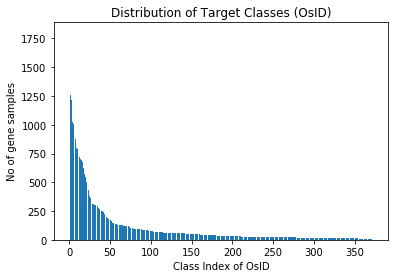

In [5]:
from collections import Counter
# summarize distribution
counter = Counter(Y.flatten())

# sort counter by keys
counter = dict(sorted(counter.items()))

for k,v in counter.items():
 per = v / len(Y.flatten()) * 100
 print('Class=%d, n=%d (%.3f%%)' % (k, v, per))
# plot the distribution
plt.bar( counter.keys(), counter.values())

plt.ylabel('No of gene samples')
plt.xlabel('Class Index of OsID')
plt.title('Distribution of Target Classes (OsID)')
plt.show()

In [6]:
def draw_confusion_matrix(cm):
    plt.figure(figsize=(12,8))
    sns.heatmap(cm,annot=True,fmt="d", center=0, cmap='autumn') 
    plt.title("Confusion Matrix")
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [7]:
# prepare target data
def prepare_targets(y_train, y_test):
	le = LabelEncoder()
	
	#fit the encoders only to the training data and then transform both train and test data
	y_train_enc = le.fit_transform(y_train)
	y_test_enc = le.transform(y_test)

	return y_train_enc, y_test_enc

In [8]:
# define baseline model (MLP)
def MLP_model(input_dim):

    model = Sequential()
    model.add(Dense(60, input_dim=input_dim,bias_initializer='normal', activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(20,bias_initializer='normal',activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(20,bias_initializer='normal',activation='relu',kernel_regularizer=regularizers.l2(0.0001)))
    model.add(Dense(373,kernel_initializer='normal', activation='softmax')) #softmax for multi-class classification, num_classes = 373

    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    return model

In [9]:
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_fs, Y, test_size=0.33, random_state=1)

# prepare output data
y_train_enc, y_test_enc = prepare_targets(y_train, y_test)

# Define the number of folds for k-fold cross-validation
k = 2

# Define the cross-validation method
cv_method = StratifiedKFold(n_splits=k)

# Initialize the list to store the history, train & validation(accuracy & loss) for each model
models = []
model_history = []
model_accuracy = []
model_train_acc = []
model_train_loss = []
model_val_acc = []
model_val_loss = []


for i in range(1,21):

    models_fold = []
    hist = []
    train_accuracy = []
    train_loss = []
    val_accuracy = []
    val_loss = []
    test_accuracy = []

    print("Number of input features:",i)

    # Select the input features from the input data
    X_train_selected = X_train[:, :i]
    X_test_selected = X_test[:, :i]

    # Loop over the folds
    for fold, (train_index, val_index) in enumerate(cv_method.split(X_train_selected, y_train)):

        print("Fold:", fold+1)

        # Split the data into train and validation sets using the current fold index
        X_train_fold  = X_train_selected[train_index]
        y_train_fold  = y_train[train_index]
        X_val_fold = X_train_selected[val_index]
        y_val_fold = y_train[val_index]

        # Prepare the target data
        y_train_fold_enc, y_val_fold_enc = prepare_targets(y_train_fold, y_val_fold)

        # build the model
        model = MLP_model(i)

        # Fit the model to the training data for the current fold
        history = model.fit(X_train_fold, to_categorical(y_train_fold_enc, num_classes=373), epochs=60, batch_size=5, verbose=1, validation_split = 0.33)
    
        # Evaluate the model on the validation data for the current fold
        val_scores = model.evaluate(X_val_fold, to_categorical(y_val_fold_enc, num_classes=373), verbose=0)
        val_accuracy.append(val_scores[1])
        val_loss.append(val_scores[0])

        # Evaluate the model on the test data for the current fold
        test_scores = model.evaluate(X_test_selected, to_categorical(y_test_enc, num_classes=373), verbose=0)
        test_accuracy.append(test_scores[1])

        # add the model to the list of models
        models_fold.append(model)
        hist.append(history)

        # store the training accuracy and loss for each fold
        train_accuracy.append(history.history['accuracy'])
        train_loss.append(history.history['loss'])
        
    # Calculate the average test and validation accuracy and loss across all folds
    avg_test_acc = sum(test_accuracy) / len(test_accuracy)
    avg_val_acc = sum(val_accuracy) / len(val_accuracy)
    avg_val_loss = sum(val_loss) / len(val_loss)

    # Print the average validation and test accuracy and loss
    print("Average Validation Accuracy:", avg_val_acc)
    print("Average Validation Loss:",avg_val_loss)
    print("Average Test Accuracy:", avg_test_acc)

    best_fold_index = test_accuracy.index(max(test_accuracy))
    model_accuracy.append(test_accuracy[best_fold_index])
    models.append(models_fold[best_fold_index])
    model_history.append(hist[best_fold_index])
    model_train_acc.append(train_accuracy[best_fold_index])
    model_train_loss.append(train_loss[best_fold_index])
    model_val_acc.append(val_accuracy[best_fold_index])
    model_val_loss.append(val_loss[best_fold_index])


    print("Final Test Accuracy for each fold:", test_accuracy[best_fold_index])

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated i

Number of input features: 1
Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/60
1834/1834 [==============================] - 4s 2ms/step - loss: 4.3995 - accuracy: 0.1083 - val_loss: 4.0110 - val_accuracy: 0.1233
Epoch 2/60
1834/1834 [==============================] - 3s 2ms/step - loss: 3.6305 - accuracy: 0.1918 - val_loss: 3.6048 - val_accuracy: 0.2006
Epoch 3/60
1834/1834 [==============================] - 3s 2ms/step - loss: 3.2834 - accuracy: 0.2492 - val_loss: 3.3508 - val_accuracy: 0.2575
Epoch 4/60
1834/1834 [==============================] - 3s 2ms/step - loss: 3.0362 - accuracy: 0.2849 - val_loss: 3.1719 - val_accuracy: 0.2925
Epoch 5/60
1834/1834 [==============================] - 4s 2ms/step - loss: 2.8617 - accuracy: 0.3114 - val_loss: 3.0338 - val_accuracy: 0.2894
Epoch 6/60
1834/1834 [==============================] - 3s 2ms/step - loss: 2.7354 - accuracy: 0.3301 - val_loss: 2.9339 - val_accuracy: 0.3324
Epoch 7/60
1834/1834 [==============================] - 3s 2ms/step - loss: 2.6317 - accuracy: 0.3471 - val_loss: 2.8742 - val_accuracy:

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 13s 4ms/step - loss: 4.0131 - accuracy: 0.2138 - val_loss: 3.3246 - val_accuracy: 0.3494
Epoch 2/60
1834/1834 [==============================] - 7s 4ms/step - loss: 2.7176 - accuracy: 0.4409 - val_loss: 2.5774 - val_accuracy: 0.4971
Epoch 3/60
1834/1834 [==============================] - 6s 4ms/step - loss: 2.0494 - accuracy: 0.5512 - val_loss: 2.0942 - val_accuracy: 0.5505
Epoch 4/60
1834/1834 [==============================] - 6s 3ms/step - loss: 1.6528 - accuracy: 0.5993 - val_loss: 1.8166 - val_accuracy: 0.6129
Epoch 5/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.4270 - accuracy: 0.6372 - val_loss: 1.6359 - val_accuracy: 0.6499
Epoch 6/60
1834/1834 [==============================] - 6s 4ms/step - loss: 1.2891 - accuracy: 0.6613 - val_loss: 1.5190 - val_accuracy: 0.6351
Epoch 7/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.1981 - accuracy: 0.6805 - val_loss: 1.4283 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 13s 4ms/step - loss: 3.8060 - accuracy: 0.2704 - val_loss: 3.0216 - val_accuracy: 0.3711
Epoch 2/60
1834/1834 [==============================] - 7s 4ms/step - loss: 2.2851 - accuracy: 0.5424 - val_loss: 2.1547 - val_accuracy: 0.6200
Epoch 3/60
1834/1834 [==============================] - 6s 3ms/step - loss: 1.5205 - accuracy: 0.6738 - val_loss: 1.6232 - val_accuracy: 0.6971
Epoch 4/60
1834/1834 [==============================] - 6s 3ms/step - loss: 1.1359 - accuracy: 0.7356 - val_loss: 1.3090 - val_accuracy: 0.7467
Epoch 5/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.9329 - accuracy: 0.7728 - val_loss: 1.1629 - val_accuracy: 0.7646
Epoch 6/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8287 - accuracy: 0.7924 - val_loss: 1.1399 - val_accuracy: 0.7540
Epoch 7/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7347 - accuracy: 0.8082 - val_loss: 1.0431 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 13s 5ms/step - loss: 3.7761 - accuracy: 0.2786 - val_loss: 2.8079 - val_accuracy: 0.4424
Epoch 2/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.9558 - accuracy: 0.6184 - val_loss: 1.7308 - val_accuracy: 0.7004
Epoch 3/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.1760 - accuracy: 0.7471 - val_loss: 1.2369 - val_accuracy: 0.7657
Epoch 4/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8126 - accuracy: 0.8098 - val_loss: 0.9869 - val_accuracy: 0.8202
Epoch 5/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6419 - accuracy: 0.8431 - val_loss: 0.8749 - val_accuracy: 0.8463
Epoch 6/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5518 - accuracy: 0.8582 - val_loss: 0.8111 - val_accuracy: 0.8401
Epoch 7/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4917 - accuracy: 0.8702 - val_loss: 0.6955 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 13s 4ms/step - loss: 3.6906 - accuracy: 0.3250 - val_loss: 2.6958 - val_accuracy: 0.5390
Epoch 2/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.8609 - accuracy: 0.6623 - val_loss: 1.7070 - val_accuracy: 0.6944
Epoch 3/60
1834/1834 [==============================] - 6s 3ms/step - loss: 1.1177 - accuracy: 0.7817 - val_loss: 1.2169 - val_accuracy: 0.7872
Epoch 4/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7484 - accuracy: 0.8466 - val_loss: 0.9248 - val_accuracy: 0.8437
Epoch 5/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5454 - accuracy: 0.8832 - val_loss: 0.7706 - val_accuracy: 0.8667
Epoch 6/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4380 - accuracy: 0.8963 - val_loss: 0.6625 - val_accuracy: 0.8953
Epoch 7/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3753 - accuracy: 0.9087 - val_loss: 0.6180 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 14s 5ms/step - loss: 3.5032 - accuracy: 0.3658 - val_loss: 2.3584 - val_accuracy: 0.5941
Epoch 2/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.6144 - accuracy: 0.7085 - val_loss: 1.4972 - val_accuracy: 0.7533
Epoch 3/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.9811 - accuracy: 0.8034 - val_loss: 1.0601 - val_accuracy: 0.8180
Epoch 4/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6914 - accuracy: 0.8489 - val_loss: 0.8688 - val_accuracy: 0.8408
Epoch 5/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.5392 - accuracy: 0.8729 - val_loss: 0.7504 - val_accuracy: 0.8753
Epoch 6/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4532 - accuracy: 0.8894 - val_loss: 0.6741 - val_accuracy: 0.8689
Epoch 7/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3994 - accuracy: 0.9032 - val_loss: 0.6040 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/60
1834/1834 [==============================] - 13s 4ms/step - loss: 3.8394 - accuracy: 0.2893 - val_loss: 2.7354 - val_accuracy: 0.5035
Epoch 2/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.8908 - accuracy: 0.6547 - val_loss: 1.6526 - val_accuracy: 0.7338
Epoch 3/60
1834/1834 [==============================] - 8s 4ms/step - loss: 1.0974 - accuracy: 0.7804 - val_loss: 1.1317 - val_accuracy: 0.7961
Epoch 4/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.7306 - accuracy: 0.8348 - val_loss: 0.8732 - val_accuracy: 0.8430
Epoch 5/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.5508 - accuracy: 0.8689 - val_loss: 0.7746 - val_accuracy: 0.8457
Epoch 6/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4587 - accuracy: 0.8867 - val_loss: 0.9674 - val_accuracy: 0.8076
Epoch 7/60
1834/1834 [==============================] - 8s 5ms/step - loss: 0.4123 - accuracy: 0.8907 - val_loss: 0.6449 - val_accuracy

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 13s 5ms/step - loss: 3.2837 - accuracy: 0.4073 - val_loss: 2.2200 - val_accuracy: 0.5872
Epoch 2/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.4864 - accuracy: 0.7175 - val_loss: 1.4042 - val_accuracy: 0.7378
Epoch 3/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.8915 - accuracy: 0.8208 - val_loss: 1.0107 - val_accuracy: 0.8167
Epoch 4/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6263 - accuracy: 0.8680 - val_loss: 0.8269 - val_accuracy: 0.8592
Epoch 5/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4958 - accuracy: 0.8844 - val_loss: 0.7293 - val_accuracy: 0.8609
Epoch 6/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.4139 - accuracy: 0.9004 - val_loss: 0.6235 - val_accuracy: 0.8795
Epoch 7/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3673 - accuracy: 0.9113 - val_loss: 0.5764 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 13s 5ms/step - loss: 3.3849 - accuracy: 0.3843 - val_loss: 2.2563 - val_accuracy: 0.6109
Epoch 2/60
1834/1834 [==============================] - 7s 4ms/step - loss: 1.5078 - accuracy: 0.7227 - val_loss: 1.3674 - val_accuracy: 0.7511
Epoch 3/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.8806 - accuracy: 0.8204 - val_loss: 1.0070 - val_accuracy: 0.8260
Epoch 4/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.6166 - accuracy: 0.8619 - val_loss: 0.7875 - val_accuracy: 0.8357
Epoch 5/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4932 - accuracy: 0.8820 - val_loss: 0.7390 - val_accuracy: 0.8496
Epoch 6/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4140 - accuracy: 0.8981 - val_loss: 0.6226 - val_accuracy: 0.8904
Epoch 7/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.3692 - accuracy: 0.9083 - val_loss: 0.5406 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 14s 5ms/step - loss: 3.6804 - accuracy: 0.3189 - val_loss: 2.5341 - val_accuracy: 0.5106
Epoch 2/60
1834/1834 [==============================] - 9s 5ms/step - loss: 1.6581 - accuracy: 0.6949 - val_loss: 1.4519 - val_accuracy: 0.7396
Epoch 3/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.9414 - accuracy: 0.8067 - val_loss: 1.0263 - val_accuracy: 0.8178
Epoch 4/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.6561 - accuracy: 0.8563 - val_loss: 0.8607 - val_accuracy: 0.8412
Epoch 5/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.5092 - accuracy: 0.8832 - val_loss: 0.8656 - val_accuracy: 0.8437
Epoch 6/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4327 - accuracy: 0.8961 - val_loss: 0.8033 - val_accuracy: 0.8860
Epoch 7/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3756 - accuracy: 0.9089 - val_loss: 0.5986 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 13s 5ms/step - loss: 3.4428 - accuracy: 0.3780 - val_loss: 2.3368 - val_accuracy: 0.6134
Epoch 2/60
1834/1834 [==============================] - 9s 5ms/step - loss: 1.5361 - accuracy: 0.7159 - val_loss: 1.3955 - val_accuracy: 0.7584
Epoch 3/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.8904 - accuracy: 0.8134 - val_loss: 0.9945 - val_accuracy: 0.8335
Epoch 4/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.6081 - accuracy: 0.8630 - val_loss: 0.8114 - val_accuracy: 0.8291
Epoch 5/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4819 - accuracy: 0.8846 - val_loss: 0.6651 - val_accuracy: 0.8764
Epoch 6/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4060 - accuracy: 0.9013 - val_loss: 0.6284 - val_accuracy: 0.8829
Epoch 7/60
1834/1834 [==============================] - 8s 5ms/step - loss: 0.3686 - accuracy: 0.9044 - val_loss: 0.5452 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 14s 6ms/step - loss: 3.5616 - accuracy: 0.3676 - val_loss: 2.4833 - val_accuracy: 0.6027
Epoch 2/60
1834/1834 [==============================] - 9s 5ms/step - loss: 1.5618 - accuracy: 0.7114 - val_loss: 1.3869 - val_accuracy: 0.7702
Epoch 3/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.8423 - accuracy: 0.8233 - val_loss: 0.9545 - val_accuracy: 0.8275
Epoch 4/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.5695 - accuracy: 0.8654 - val_loss: 0.7340 - val_accuracy: 0.8791
Epoch 5/60
1834/1834 [==============================] - 10s 5ms/step - loss: 0.4467 - accuracy: 0.8900 - val_loss: 0.6755 - val_accuracy: 0.8716
Epoch 6/60
1834/1834 [==============================] - 10s 5ms/step - loss: 0.3780 - accuracy: 0.9060 - val_loss: 0.6070 - val_accuracy: 0.8849
Epoch 7/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3405 - accuracy: 0.9104 - val_loss: 0.5046 - va

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 13s 5ms/step - loss: 3.5471 - accuracy: 0.3424 - val_loss: 2.3328 - val_accuracy: 0.6039
Epoch 2/60
1834/1834 [==============================] - 9s 5ms/step - loss: 1.5175 - accuracy: 0.7099 - val_loss: 1.3999 - val_accuracy: 0.7569
Epoch 3/60
1834/1834 [==============================] - 8s 5ms/step - loss: 0.8512 - accuracy: 0.8204 - val_loss: 0.9622 - val_accuracy: 0.8018
Epoch 4/60
1834/1834 [==============================] - 7s 4ms/step - loss: 0.5890 - accuracy: 0.8583 - val_loss: 0.8005 - val_accuracy: 0.8578
Epoch 5/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4730 - accuracy: 0.8848 - val_loss: 0.6955 - val_accuracy: 0.8678
Epoch 6/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4033 - accuracy: 0.8971 - val_loss: 0.6442 - val_accuracy: 0.8742
Epoch 7/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.3656 - accuracy: 0.9067 - val_loss: 0.5809 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 14s 5ms/step - loss: 3.6390 - accuracy: 0.3258 - val_loss: 2.3302 - val_accuracy: 0.5853
Epoch 2/60
1834/1834 [==============================] - 8s 5ms/step - loss: 1.4828 - accuracy: 0.7240 - val_loss: 1.2610 - val_accuracy: 0.7646
Epoch 3/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.8517 - accuracy: 0.8200 - val_loss: 0.9604 - val_accuracy: 0.8167
Epoch 4/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.6073 - accuracy: 0.8591 - val_loss: 0.7264 - val_accuracy: 0.8636
Epoch 5/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4900 - accuracy: 0.8812 - val_loss: 0.6390 - val_accuracy: 0.8775
Epoch 6/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4215 - accuracy: 0.8940 - val_loss: 0.6177 - val_accuracy: 0.8762
Epoch 7/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3675 - accuracy: 0.9063 - val_loss: 0.5255 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 15s 6ms/step - loss: 3.2836 - accuracy: 0.4139 - val_loss: 2.1017 - val_accuracy: 0.6417
Epoch 2/60
1834/1834 [==============================] - 8s 4ms/step - loss: 1.3831 - accuracy: 0.7411 - val_loss: 1.3032 - val_accuracy: 0.7609
Epoch 3/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.8604 - accuracy: 0.8173 - val_loss: 0.9450 - val_accuracy: 0.8326
Epoch 4/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.6187 - accuracy: 0.8603 - val_loss: 0.7720 - val_accuracy: 0.8519
Epoch 5/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4883 - accuracy: 0.8807 - val_loss: 0.6690 - val_accuracy: 0.8705
Epoch 6/60
1834/1834 [==============================] - 8s 5ms/step - loss: 0.4139 - accuracy: 0.8976 - val_loss: 0.6038 - val_accuracy: 0.8873
Epoch 7/60
1834/1834 [==============================] - 8s 5ms/step - loss: 0.3607 - accuracy: 0.9085 - val_loss: 0.5389 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 14s 6ms/step - loss: 3.4161 - accuracy: 0.3773 - val_loss: 2.2639 - val_accuracy: 0.6114
Epoch 2/60
1834/1834 [==============================] - 9s 5ms/step - loss: 1.3894 - accuracy: 0.7457 - val_loss: 1.2407 - val_accuracy: 0.7952
Epoch 3/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.7331 - accuracy: 0.8488 - val_loss: 0.8951 - val_accuracy: 0.8638
Epoch 4/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4927 - accuracy: 0.8909 - val_loss: 0.6951 - val_accuracy: 0.8833
Epoch 5/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3804 - accuracy: 0.9080 - val_loss: 0.6639 - val_accuracy: 0.8773
Epoch 6/60
1834/1834 [==============================] - 8s 5ms/step - loss: 0.3206 - accuracy: 0.9200 - val_loss: 0.5420 - val_accuracy: 0.9088
Epoch 7/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.2741 - accuracy: 0.9318 - val_loss: 0.4756 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/60
1834/1834 [==============================] - 13s 5ms/step - loss: 3.5134 - accuracy: 0.3555 - val_loss: 2.2397 - val_accuracy: 0.5959
Epoch 2/60
1834/1834 [==============================] - 9s 5ms/step - loss: 1.3977 - accuracy: 0.7455 - val_loss: 1.2380 - val_accuracy: 0.7983
Epoch 3/60
1834/1834 [==============================] - 8s 5ms/step - loss: 0.7213 - accuracy: 0.8567 - val_loss: 0.8236 - val_accuracy: 0.8818
Epoch 4/60
1834/1834 [==============================] - 8s 5ms/step - loss: 0.4549 - accuracy: 0.9023 - val_loss: 0.6814 - val_accuracy: 0.8899
Epoch 5/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3402 - accuracy: 0.9215 - val_loss: 0.5737 - val_accuracy: 0.9130
Epoch 6/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.2855 - accuracy: 0.9335 - val_loss: 0.4931 - val_accuracy: 0.9254
Epoch 7/60
1834/1834 [==============================] - 10s 5ms/step - loss: 0.2484 - accuracy: 0.9414 - val_loss: 0.4770 - val_accurac

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 13s 5ms/step - loss: 3.1573 - accuracy: 0.4058 - val_loss: 1.8918 - val_accuracy: 0.6574
Epoch 2/60
1834/1834 [==============================] - 8s 5ms/step - loss: 1.2522 - accuracy: 0.7571 - val_loss: 1.1792 - val_accuracy: 0.7930
Epoch 3/60
1834/1834 [==============================] - 10s 5ms/step - loss: 0.7226 - accuracy: 0.8451 - val_loss: 0.8351 - val_accuracy: 0.8523
Epoch 4/60
1834/1834 [==============================] - 8s 5ms/step - loss: 0.4824 - accuracy: 0.8885 - val_loss: 0.6395 - val_accuracy: 0.8840
Epoch 5/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3644 - accuracy: 0.9103 - val_loss: 0.5355 - val_accuracy: 0.9035
Epoch 6/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3047 - accuracy: 0.9259 - val_loss: 0.4812 - val_accuracy: 0.9123
Epoch 7/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.2572 - accuracy: 0.9373 - val_loss: 0.4321 - val

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1


c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:235: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\preprocessing\label.py:252: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Epoch 1/60
1834/1834 [==============================] - 14s 5ms/step - loss: 3.4476 - accuracy: 0.3540 - val_loss: 2.2323 - val_accuracy: 0.6353
Epoch 2/60
1834/1834 [==============================] - 9s 5ms/step - loss: 1.4044 - accuracy: 0.7466 - val_loss: 1.2257 - val_accuracy: 0.8056
Epoch 3/60
1834/1834 [==============================] - 10s 5ms/step - loss: 0.7450 - accuracy: 0.8535 - val_loss: 0.8562 - val_accuracy: 0.8632
Epoch 4/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.4609 - accuracy: 0.9033 - val_loss: 0.6446 - val_accuracy: 0.9048
Epoch 5/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3247 - accuracy: 0.9276 - val_loss: 0.5872 - val_accuracy: 0.8997
Epoch 6/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.2653 - accuracy: 0.9374 - val_loss: 0.5221 - val_accuracy: 0.9057
Epoch 7/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.2230 - accuracy: 0.9484 - val_loss: 0.5229 - val_accurac

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:670: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  test_folds = np.zeros(n_samples, dtype=np.int)
c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review

Fold: 1
Epoch 1/60
1834/1834 [==============================] - 12s 5ms/step - loss: 3.3518 - accuracy: 0.3505 - val_loss: 2.1815 - val_accuracy: 0.5527
Epoch 2/60
1834/1834 [==============================] - 9s 5ms/step - loss: 1.3904 - accuracy: 0.7321 - val_loss: 1.2404 - val_accuracy: 0.7821
Epoch 3/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.7772 - accuracy: 0.8484 - val_loss: 0.9767 - val_accuracy: 0.8302
Epoch 4/60
1834/1834 [==============================] - 8s 4ms/step - loss: 0.4857 - accuracy: 0.8969 - val_loss: 0.6737 - val_accuracy: 0.8915
Epoch 5/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.3393 - accuracy: 0.9225 - val_loss: 0.5374 - val_accuracy: 0.9181
Epoch 6/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.2572 - accuracy: 0.9385 - val_loss: 0.4683 - val_accuracy: 0.9205
Epoch 7/60
1834/1834 [==============================] - 9s 5ms/step - loss: 0.2266 - accuracy: 0.9447 - val_loss: 0.4207 - val_

In [10]:
#to show the no of input features and its corresponding model accuracy
model_list = []

#Iterate through each model's accuracy 
for i in range (len(model_accuracy)):
    #get the number of input features for the current model
    no_features = i + 1

    #round the model accuries to 3 d.p.
    rounded_model_acc = round(model_accuracy[i], 3)
    
    model_list.append([no_features, rounded_model_acc])

models_df = pd.DataFrame(model_list, columns=["No of input features", "Model accuracy"])

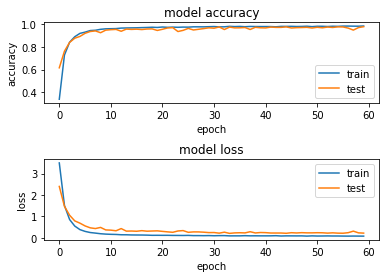

Final Test Accuracy: 0.9857006072998047


In [11]:
# Select the final model based on the max test accuracy across all models

best_model_index = model_accuracy.index(max(model_accuracy))

best_model = models[best_model_index]
best_model_history = model_history[best_model_index]
best_model_train_acc = model_train_acc[best_model_index]
best_model_train_loss = model_train_loss[best_model_index]
best_model_val_acc = model_val_acc[best_model_index]
best_model_val_loss = model_val_loss[best_model_index]

# summarize history for accuracy  
plt.subplot(211)  
plt.plot(best_model_history.history['accuracy'])  
plt.plot(best_model_history.history['val_accuracy'])  
plt.title('model accuracy')  
plt.ylabel('accuracy')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='lower right')  

# summarize history for loss
plt.subplot(212)  
plt.plot(best_model_history.history['loss'])  
plt.plot(best_model_history.history['val_loss'])  
plt.title('model loss')  
plt.ylabel('loss')  
plt.xlabel('epoch')  
plt.legend(['train', 'test'], loc='upper right')  
plt.subplots_adjust(hspace=0.7)

plt.show() 

print("Final Test Accuracy:", model_accuracy[best_model_index])

In [12]:
# Evaluate the best model on the test data
y_pred = best_model.predict(X_test)

# np.argmax() is used to convert the one-hot encoded predictions and test labels to class labels.
y_pred_label = np.argmax(y_pred, axis = 1)

# Print the classification report
print("Classification report:\n", classification_report(y_test_enc, y_pred_label))


ValueError: in user code:

    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\training.py", line 2137, in predict_function  *
        return step_function(self, iterator)
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\training.py", line 2123, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\training.py", line 2111, in run_step  **
        outputs = model.predict_step(data)
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\training.py", line 2079, in predict_step
        return self(x, training=False)
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "c:\ProgramData\Anaconda3\lib\site-packages\keras\engine\input_spec.py", line 296, in assert_input_compatibility
        f'Input {input_index} of layer "{layer_name}" is '

    ValueError: Input 0 of layer "sequential_37" is incompatible with the layer: expected shape=(None, 19), found shape=(None, 20)


In [ ]:
# extract class labels from test data
class_test = y_test_enc

# Invert OsID_labels dictionary
inv_OsID_labels = {v: k for k, v in OsID_labels.items()}

# map OsID values to the class labels
OsID_test = [inv_OsID_labels.get(value, 'Unknown') for value in class_test]

# create dataframe with OsID, true class, predicted class, and true/false columns
results = pd.DataFrame({
    'OsID': OsID_test,
    'True Class': y_test_enc,
    'Predicted Class': y_pred_label,
    'True/False': class_test == y_pred_label
})

# display dataframe
print(results.head())

# save results_df to a CSV file
results.to_csv('MLP_gene classification.csv', index=False)

           OsID  True Class  Predicted Class  True/False
0  Os11g0704500         328              328        True
1  Os09g0279600         161              161        True
2  Os03g0669100          17               17        True
3  Os05g0542500          34               34        True
4  Os09g0522000           7                7        True
